# LMECA2300: Advanced Numerical Methods
## Assignment 5

**Students:**
- Student 1: Victor Lepère (61502000)
- Student 2: Max Opdecam(77062000)

In this assignement, we will implement the multipole decomposition method for analyzing how a radiated field from a point A behaves around a decentered point B. It basically consists of considering the Fourier series of the Hankel function and substituting the resulting cosine terms using the Anger-Jacobi formula. This yields:
$$
H_0^{(2)} (k R) = \frac{1}{M} \sum_\beta \sum_l H_l^{(2)} (k R_0) \epsilon(l) (-j)^l \cos (l (\beta - \phi_0)) e^{-j k \bold{\mu}_\beta \cdot \bold r_0}
$$
Where the two sums represent discretization using $M$ and $N$ values resp. In the implementation, we will use instances of class `Point` to represent A and B. Furthermore, the `integrate_decenter` method implements the multipole decomposition w.r.t. a obserber point given as argument, relying on the above discretization.

In [33]:
### Imports
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.animation
from scipy.special import hankel2
from math import ceil

### Physical constants
rho0 = 1.2 # air, 20°C, 1 atm
f = 100 # [hz]
w = 2*np.pi*f # air -> 343 = w/k
k = w/343
lambda_ = (2*np.pi)/k
    
class Point:
    def __init__(self,x,y):
        self.x = np.asarray(x)
        self.y = np.asarray(y)
    def integrate_gen(self, Vn, obs):
        """
        Integrates for general observer ,point source.

        @param Vn: constant normal velocity
        @param obs: coord. of observer (or vector of coords)
        """
        obs = np.atleast_2d(obs) # (N,2)
        
        diff = obs - (self.x,self.y)
        rho = np.linalg.norm(diff, axis=-1) # (N,m)
        H = hankel2(0, k * rho) # (N,m)
        
        if np.any(np.isnan(H)):
            raise ValueError("Hankel function evaluated at singular point, change geometry or grid.")
        integral = w * rho0 * Vn  * H/4 # (N,)
        return integral
        
    def integrate_decenter(self,P_obs,Vn, obs, m=50, n=21):
        """
        Integrates for decenter observer ,point source.

        @param Vn: constant normal velocity
        @param obs: coord. of observer (or vector of coords)
        @param 
        """
        def e(l):
            if l==0:
                return 1
            return 2
        beta = np.linspace(0, 2*np.pi,m)
        l = np.arange(0,n,1)
        obs = np.atleast_2d(obs) # (N,2)
        
        R0 = np.linalg.norm((self.x-P_obs.x,self.y-P_obs.y))
        phi0 = np.arctan2(P_obs.y-self.y,P_obs.x-self.x)
        #print(phi0*180/3.14)
        r0 = (P_obs.x,P_obs.y) - obs # (N,2)
        temp = np.zeros((n,len(r0)),dtype=complex)
        temp2 = np.zeros((m,len(r0)),dtype=complex)
        for i in range(len(beta)):
            u_beta = [np.cos(beta[i]), np.sin(beta[i])]
            for j in l:
                temp[j,:] = hankel2(j, k * R0)*e(l[j])*((-1j)**l[j])*np.cos(l[j]*(beta[i]-phi0))*np.exp(1j * k * (np.asarray(r0) @ np.asarray(u_beta))) # (n,N)
                #print(temp)
            temp2[i,:] = np.sum(temp,axis = 0)  #(m,N)
            #print(temp2)
        temp2[0, :] *= .5
        temp2[-1, :] *= .5
        H = np.sum(temp2,axis=0)
        if np.any(np.isnan(H)):
            raise ValueError("Hankel function evaluated at singular point, change geometry or grid.")
        integral = w * rho0 * Vn  * H/ (4*m) # (N,)
        return integral

Find below an example where $A = (-10 \lambda, -10 \lambda)$ and $B = (0, 0)$ that shows the resulting computed pressure field. We display a $4 \lambda \times 4 \lambda$ domain around the observer 

In [35]:
point_source = Point(-10*lambda_, -10*lambda_)
point_obs = Point(0,0)
gridsize = 50
x = np.linspace(-2*lambda_, 2*lambda_, gridsize)
X, Y = np.meshgrid(x, x)
coord_array = np.column_stack((X.ravel(), Y.ravel()))
grid_integrals = point_source.integrate_decenter(point_obs,1, coord_array, m=1000)
#grid_integrals = point_source.integrate_gen(1, coord_array)

plt.rcParams["animation.html"] = "jshtml"
plt.ioff()
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
delta_t = (1/f)/10

pressures = np.real(grid_integrals * np.exp(1j*w*0*delta_t))
surf = ax.plot_surface(X, Y, pressures.reshape(X.shape),cmap=cm.coolwarm)
ax.set_xlim(-2*lambda_, 2*lambda_)
ax.set_ylim(-2*lambda_, 2*lambda_)
ax.set_zlim(-200, 200)
ax.set_title("Pressure field total")
fig.tight_layout()
def animate(t):
    global surf
    surf.remove()
    pressures = np.real(grid_integrals * np.exp(1j*w*t*delta_t))
    surf = ax.plot_surface(X, Y, pressures.reshape(X.shape),cmap=cm.coolwarm)
    fig.tight_layout()
    return(surf,)
    
matplotlib.animation.FuncAnimation(fig, animate, frames=50, interval=100)

To assess the correctness of the derived approximation, we will compare it with the method used in the previous assignments.
Our comparison metric will rely on the relative complex error defined as:
$$
\text{error} = \frac{|P - P^*|}{|P^*|}
$$
We indeed directly compare the complex phasors between each other to avoid time dependency. We first consider the same scenario of the previous example and analysis the impact of the discretization of $\beta$ on the accuracy of the result. The number of $\ell$-terms is fixed to 100.

In [104]:
nb_points = np.arange(10, 2000, 200)
errors = np.zeros_like(nb_points, dtype=float)
for i in range(len(nb_points)):
    grid_vanilla = point_source.integrate_gen(1, coord_array)
    grid_multipole = point_source.integrate_decenter(point_obs, 1, coord_array, m=nb_points[i], n=30)

    errors[i] = np.mean(np.abs(grid_multipole - grid_vanilla) / np.abs(grid_vanilla))

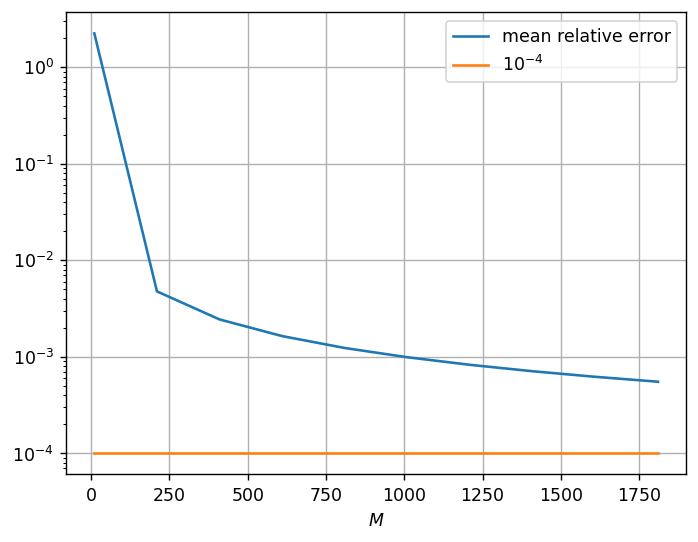

In [105]:
plt.plot(nb_points, errors, label="mean relative error")
plt.plot(nb_points, 1e-4 * np.ones_like(errors), label="$10^{-4}$")
plt.legend()
plt.grid()
plt.xlabel("$M$")
plt.yscale("log")
plt.show()

We observe that many terms seem to be needed to achieve a relative error of $10^{-4}$. The limiting factor might be the too small number of $\ell$-terms considered. Fixing $M = 1000$, we can analyze their impact on accuracy as follows:

In [98]:
nb_points_l = np.arange(10, 120, 10)
errors_l = np.zeros_like(nb_points_l, dtype=float)
for i in range(len(nb_points_l)):
    grid_vanilla = point_source.integrate_gen(1, coord_array)
    grid_multipole = point_source.integrate_decenter(point_obs, 1, coord_array, m=1000, n=nb_points_l[i])

    errors_l[i] = np.mean(np.abs(grid_multipole - grid_vanilla) / np.abs(grid_vanilla))

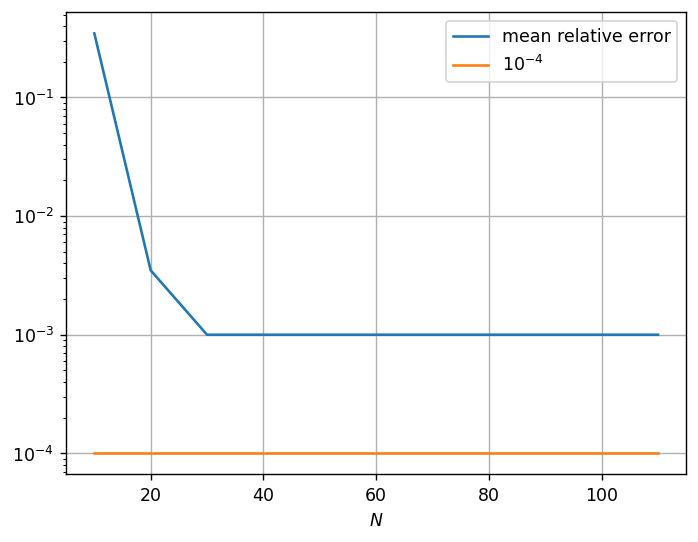

In [99]:
plt.plot(nb_points_l, errors_l, label="mean relative error")
plt.plot(nb_points_l, 1e-4 * np.ones_like(errors_l), label="$10^{-4}$")
plt.legend()
plt.grid()
plt.xlabel("$N$")
plt.yscale("log")
plt.show()

A plateau seems to be reached from N = 30 as increasing the number of terms do not improve the accuracy of the model. We will now inspect the influence of the domain size on the total number of terms needed to achieve a low relative error. Although the statement suggested $10^{-4}$, we will tie up to $10^{-3}$ to avoid too large execution times and since our error metric may differ with the expected one. We proceed by trial and error for square domain of different sizes and report the smallest acceptable parameters found in the table below. We observed that the relative error is more sensible to $N$ than $M$ to achieve a low error.

In [197]:
sz=15
x = np.linspace(-(sz/2)*lambda_, (sz/2)*lambda_, gridsize)
X, Y = np.meshgrid(x, x)
coord_array = np.column_stack((X.ravel(), Y.ravel()))
grid_multipole = point_source.integrate_decenter(point_obs,1, coord_array, m=2000, n=70)
grid_vanilla = point_source.integrate_gen(1, coord_array)

rel_err = np.mean(np.abs(grid_multipole - grid_vanilla)/ np.abs(grid_vanilla))
if rel_err > 1e-3:
    print(f"error: {rel_err:e}, keep searching !")
else:
    print(f"error: {rel_err:e}, congrats :)")

error: 9.541482e-04, congrats :)



| Domain size [$\lambda$] | M | N | Total |
|:-----------------------:|:-:|:-:|:-----:|
| 4 | 1000 | 30 | 1030| 
| 10 | 1175 | 50 | 1225| 
| 15 | 2000 | 70 | 2070 |

Also note that when $N$ goes larger than $100$, the relative error start increasing instead of decreasing. This prevents us from considering larger domain size such as $50 \lambda$.